# Differential Accessibility between WT and KD within celltypes

In [1]:
here::i_am("rna_atac/differential/ATAC.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(ArchR))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))


BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

addArchRThreads(24)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”

                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | 

In [2]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/differential/v2/Accessibility/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [3]:
# Load meta
meta = fread(args$metadata)[day!='D3'] %>% # remove D3 cells
    .[,celltype_genotype:=paste0(celltype_v2, '-', genotype)]

In [4]:
# Functions
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=names(opts$celltype_v2.colors))] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=names(opts$celltype_v2.colors))]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0),
                        legend.position='bottom')
p
    return(p)
}

#### Load Data

In [5]:
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

## ArchR

#### Differential ChromVAR

In [4]:
# Differential chromVAR
differential_chromvar = function(x, test = 'wilcoxon', matrix = 'DeviationMatrix_CISBP'){
        message(x)
        tmp = ArchRProject[meta[celltype_v2==x]$cell]
        # Differential ChromVAR one v all
        diffMotif <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = test,
            binarize = FALSE,
            useMatrix = matrix,
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            useSeqnames="z",
            verbose = F
        )

        tmp2 = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                      FDR = assay(diffMotif[,1], 'FDR')[[1]],
                                      MeanDiff = assay(diffMotif[,1], 'MeanDiff')[[1]]) %>% 
                            .[order(-MeanDiff)] %>% 
                            .[,celltype_v2 := x]
    return(tmp2)
}  
# volcano plot
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(logFC, -log10(padj_fdr), col=sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=feature), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none')

    
    return(p)
}

In [ ]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltype_v2),
                                    cells = meta$cell,
                                    name = "celltype_v2",
                                    force=TRUE)

ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$genotype),
                                    cells = meta$cell,
                                    name = "genotype",
                                    force=TRUE)

In [ ]:
keep = names(opts$celltype_v2.colors)[names(opts$celltype_v2.colors) != 'Blood_Progenitor']

In [10]:
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'DeviationMatrix_CISBP', mc.cores=12) %>% rbindlist()

In [11]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_CISBP.txt.gz', args$outdir))

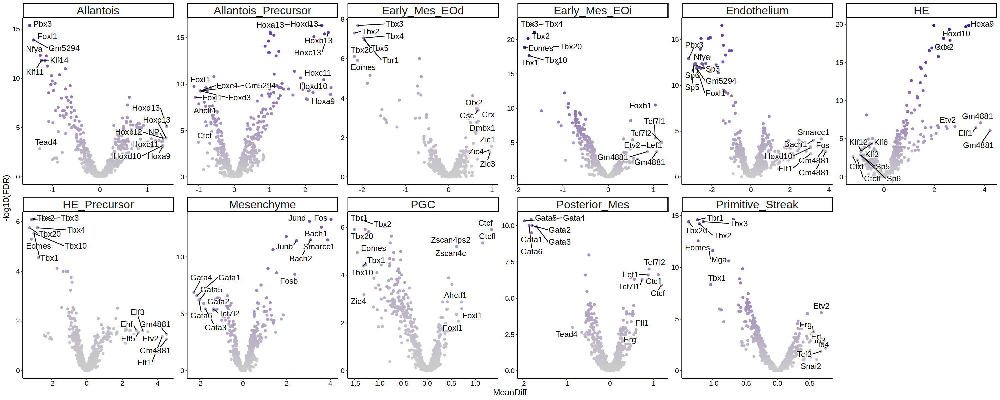

In [12]:
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v2, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

Aggregate function missing, defaulting to 'length'



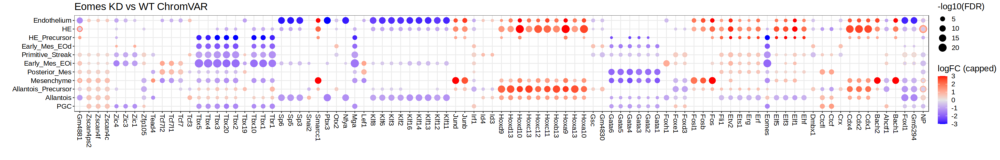

In [13]:
top_n = 10
cap = 3
motifs_keep = c(ChromVAR.dt[,head(.SD, top_n), by=celltype_v2][, motif], ChromVAR.dt[,tail(.SD, top_n), by=celltype_v2][, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v2')] %>% dcast(., celltype_v2 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v2')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [14]:
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'DeviationMatrix_JASPAR', mc.cores=12) %>% rbindlist()

In [15]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_JASPAR.txt.gz', args$outdir))

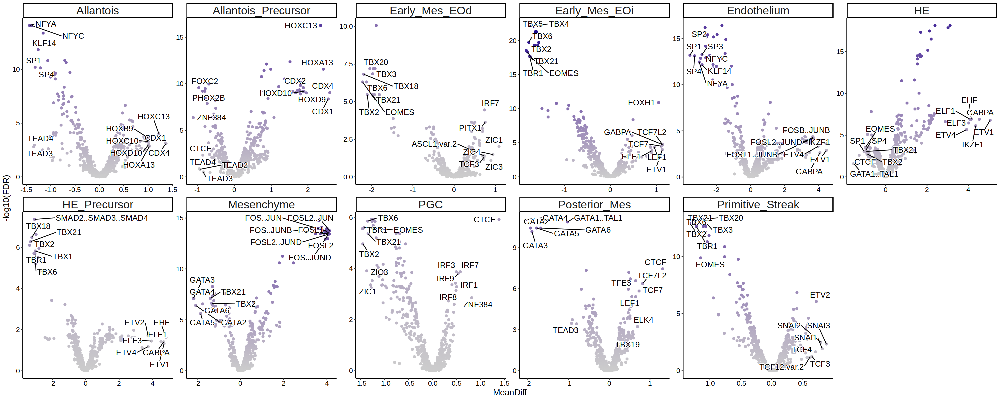

In [16]:
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v2, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

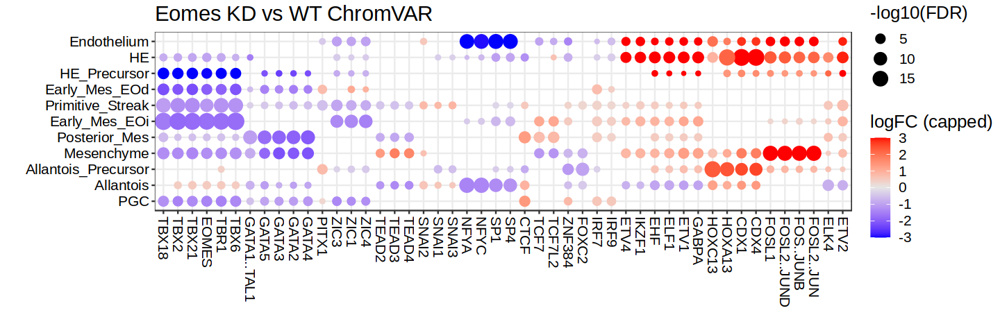

In [17]:
top_n = 4
cap = 3
motifs_keep = c(ChromVAR.dt[,head(.SD, top_n), by=celltype_v2][, motif], ChromVAR.dt[,tail(.SD, top_n), by=celltype_v2][, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v2')] %>% dcast(., celltype_v2 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v2')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, logFC_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=logFC_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

# Using In silico ChIP-seq

In [54]:
# Differential chromvar function
differential_chromvar = function(x, matrix = 'silicoChIP'){
        message(x)
        tmp = ArchRProject[meta[celltype_v2==x]$cell]
    tmp@cellColData$genotype = meta[celltype_v2==x]$genotype

        # Differential ChromVAR one v all
        diffMotif <- getMarkerFeatures(
            ArchRProj = tmp, 
            testMethod = 'wilcoxon',
            binarize = FALSE,
            useMatrix = matrix,
            groupBy = "genotype",
              useGroups = 'KO',
              bgdGroups = 'WT',
            useSeqnames="z",
            verbose = F
        )

        tmp2 = data.table(motif = str_split(rowData(diffMotif)$name, '_') %>% map_chr(1),
                                      FDR = assay(diffMotif[,1], 'FDR')[[1]],
                                      MeanDiff = assay(diffMotif[,1], 'MeanDiff')[[1]]) %>% 
                            .[order(-MeanDiff)] %>% 
                            .[,celltype_v2 := x] %>% 
                            .[, MeanDiff := ifelse(MeanDiff == -Inf, min(.[MeanDiff != -Inf, MeanDiff]), # Remove infinite values if they show up
                                                  ifelse(MeanDiff == Inf, max(.[MeanDiff != Inf, MeanDiff]), MeanDiff))]
    return(tmp2)
}  

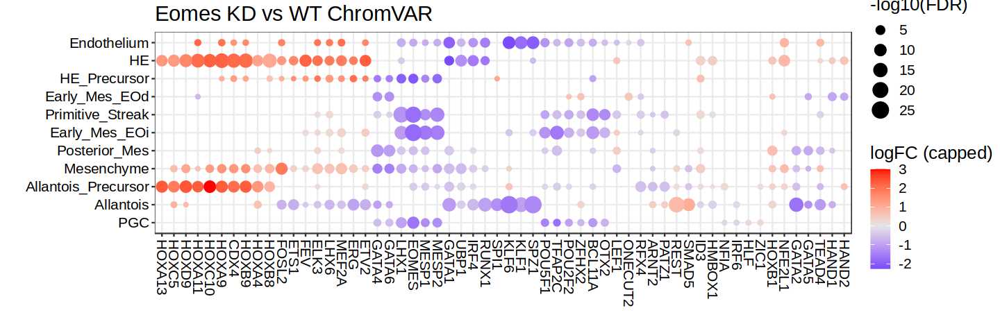

In [59]:
# CISBP

keep = names(opts$celltype_v2.colors)[names(opts$celltype_v2.colors) != 'Blood_Progenitor']
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_CISBPMatrix', mc.cores=12) %>% rbindlist()

top_n = 4
cap = 3
motifs_keep = c(ChromVAR.dt[FDR<0.05] %>% 
                    .[,head(.SD, top_n), by=celltype_v2] %>% .[, motif], 
                ChromVAR.dt[FDR<0.05] %>% 
                    .[,tail(.SD, top_n), by=celltype_v2] %>% .[, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v2')] %>% dcast(., celltype_v2 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v2')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, MeanDiff_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=MeanDiff_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [60]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_CISBP_silico.txt.gz', args$outdir))

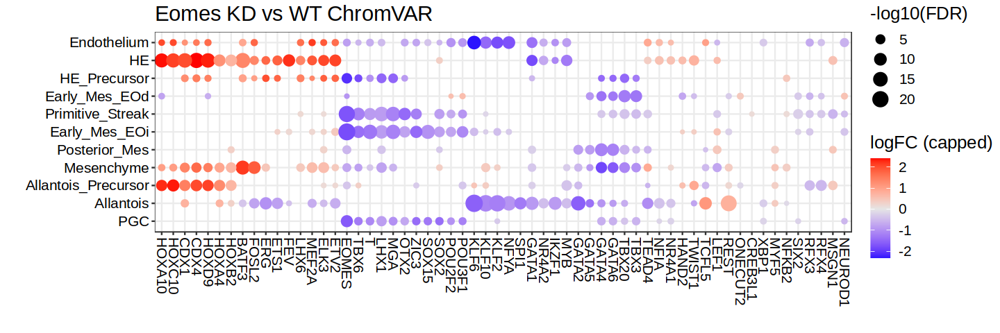

In [62]:
# JASPAR

keep = names(opts$celltype_v2.colors)[names(opts$celltype_v2.colors) != 'Blood_Progenitor']
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_JASPARMatrix', mc.cores=12) %>% rbindlist()

top_n = 4
cap = 3
motifs_keep = c(ChromVAR.dt[FDR<0.05] %>% 
                    .[,head(.SD, top_n), by=celltype_v2] %>% .[, motif], 
                ChromVAR.dt[FDR<0.05] %>% 
                    .[,tail(.SD, top_n), by=celltype_v2] %>% .[, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v2')] %>% dcast(., celltype_v2 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v2')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, MeanDiff_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=12, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=MeanDiff_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [63]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_JASPAR_silico.txt.gz', args$outdir))

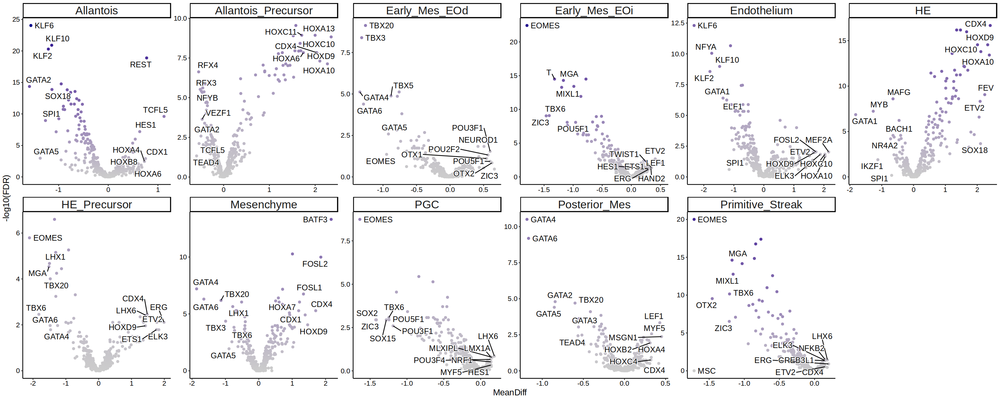

In [64]:
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v2, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

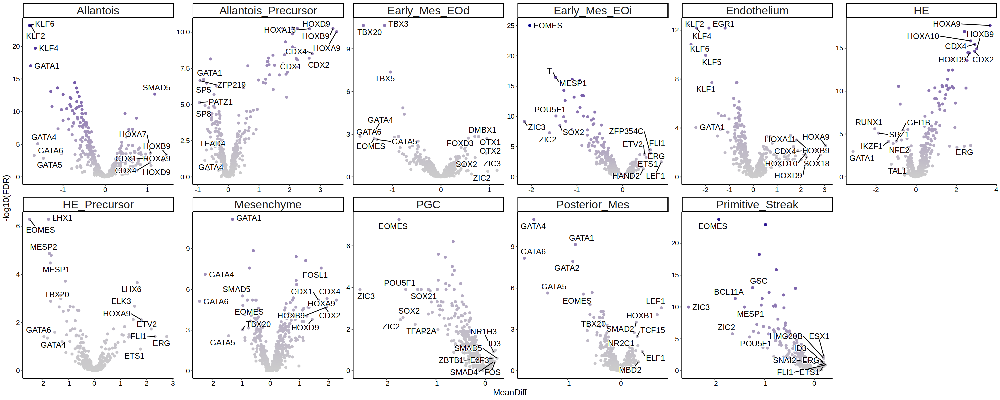

In [65]:
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_CISBP_v2', mc.cores=12) %>% rbindlist()
fwrite(ChromVAR.dt, sprintf('%s/dsilicoChIP_CISBP_v2.txt.gz', args$outdir))
p = ggplot(ChromVAR.dt, aes(MeanDiff, -log10(FDR), label=motif)) +
            geom_point(aes(col = -log10(FDR))) +
            scale_color_gradient(low='gray80', high='darkblue', name = '-log10(FDR)') + 
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff>0] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
            ggrepel::geom_text_repel(data=ChromVAR.dt[MeanDiff<0][order(MeanDiff)] %>% 
                                            .[,head(.SD, 7), by=celltype_v2],
                                aes(x=MeanDiff, y=-log10(FDR)), 
                                 max.overlaps=Inf, 
                                 box.padding = 0.4,
                                 bg.color='white', 
                                 bg.r = 0.1,
                                 size=5) +
    facet_wrap(~celltype_v2, scales='free', ncol=6) + 
    theme_classic() +
    theme(
       axis.text = element_text(color='black'),
      # axis.title = element_text(size=rel(1.0), color='black'),
        strip.text = element_text(size=20),
      text=element_text(size=15),
      legend.position="none"
    ) 
options(repr.plot.width=25, repr.plot.height=10)
p

In [61]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"   "DeviationMatrix_JASPAR" 
 [3] "GeneScoreMatrix_TSS"     "GeneScoreMatrix_distal" 
 [5] "MarkerPeaksMatrix"       "MotifMatrix"            
 [7] "PeakMatrix"              "PeakMatrix_atlas"       
 [9] "TileMatrix"              "silicoChIPMatrix"       
[11] "silicoChIP_CISBPMatrix"  "silicoChIP_CISBP_v2"    
[13] "silicoChIP_JASPARMatrix" "silicoChIP_JASPAR_v2"

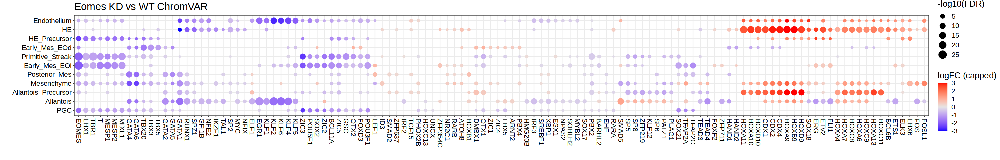

In [71]:
# CISBP v2

keep = names(opts$celltype_v2.colors)[names(opts$celltype_v2.colors) != 'Blood_Progenitor']
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_CISBP_v2', mc.cores=12) %>% rbindlist()

top_n = 10
cap = 3
motifs_keep = c(ChromVAR.dt[FDR<0.05] %>% 
                    .[,head(.SD, top_n), by=celltype_v2] %>% .[, motif], 
                ChromVAR.dt[FDR<0.05] %>% 
                    .[,tail(.SD, top_n), by=celltype_v2] %>% .[, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v2')] %>% dcast(., celltype_v2 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v2')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, MeanDiff_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=MeanDiff_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [72]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_silicoChIP_CISBP_v2.txt.gz', args$outdir))

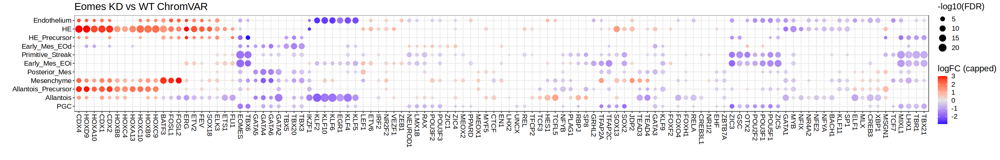

In [73]:
# JASPAR v2

keep = names(opts$celltype_v2.colors)[names(opts$celltype_v2.colors) != 'Blood_Progenitor']
ChromVAR.dt = mclapply(keep, differential_chromvar, matrix = 'silicoChIP_JASPAR_v2', mc.cores=12) %>% rbindlist()

top_n = 10
cap = 3
motifs_keep = c(ChromVAR.dt[FDR<0.05] %>% 
                    .[,head(.SD, top_n), by=celltype_v2] %>% .[, motif], 
                ChromVAR.dt[FDR<0.05] %>% 
                    .[,tail(.SD, top_n), by=celltype_v2] %>% .[, motif])

# Turn dt in matrix
DEGs.mtx = ChromVAR.dt[motif %in% motifs_keep ,c('motif',  'MeanDiff', 'celltype_v2')] %>% dcast(., celltype_v2 ~ motif, value.var = 'MeanDiff')
DEGs.mtx[is.na(DEGs.mtx)] = 0
DEGs.mtx = DEGs.mtx %>% as.data.frame() %>% tibble::column_to_rownames('celltype_v2')

# Cluster genes by logFC
order = hclust(dist(t(DEGs.mtx)))

# prepare data.table for plotting
to.plot = ChromVAR.dt[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = order$labels[order$order])] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, MeanDiff_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=25, repr.plot.height=4)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=MeanDiff_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='logFC (capped)') + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR') + 
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=12, color='black'),
         text=element_text(size=15))

In [74]:
fwrite(ChromVAR.dt, sprintf('%s/dChromVAR_silicoChIP_JASPAR_v2.txt.gz', args$outdir))

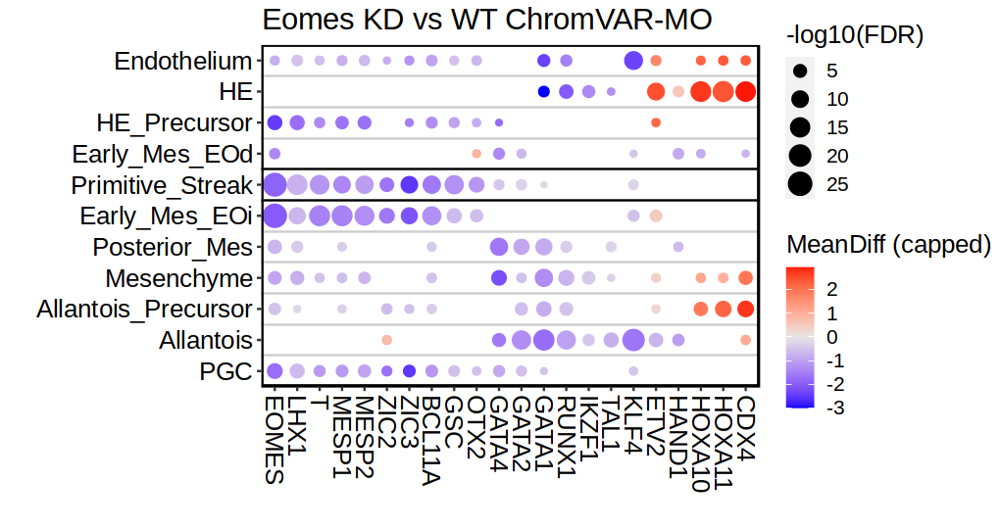

In [85]:
dchromVAR_mo = fread(sprintf('%s/dChromVAR_silicoChIP_CISBP_v2.txt.gz', args$outdir))

motifs_keep = c('EOMES', 'LHX1', 'T', 'MESP1', 'MESP2', 'ZIC2', 'ZIC3', 'BCL11A', 'GSC', 'OTX2',
                'GATA4', 'GATA2', 'GATA1', 'RUNX1', 'IKZF1', 'TAL1', 'KLF4',
                'ETV2', 'HAND1',
                'HOXA10', 'HOXA11', 'CDX4'
               )

# prepare data.table for plotting
to.plot = dchromVAR_mo[motif %in% motifs_keep & FDR < 0.05] %>%
    .[, gene := factor(motif, levels = motifs_keep)] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, MeanDiff_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=8.5, repr.plot.height=4.5)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=MeanDiff_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='MeanDiff (capped)') + 
    geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
    geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR-MO') + 
    scale_y_discrete(expand = c(0, 0.5)) + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=15, color='black'),
         text=element_text(size=15),
             panel.border = element_rect(color='black', linewidth=1, fill = NA),
             panel.background = element_blank(),
                      axis.line = element_blank(),
          strip.background = element_blank()
)

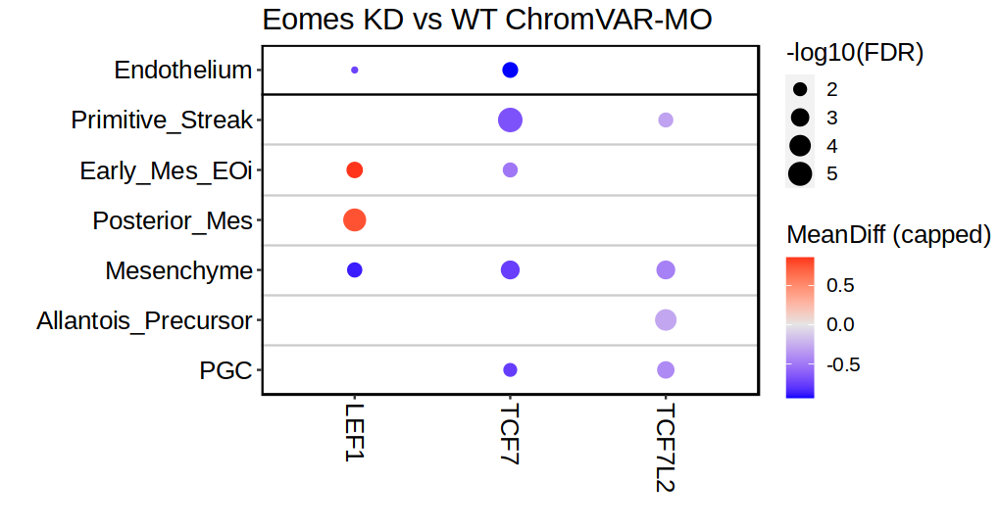

In [363]:
dchromVAR_mo = fread(sprintf('%s/dChromVAR_silicoChIP_CISBP_v2.txt.gz', args$outdir))

motifs_keep = c('LEF1', 'TCF7', 'TCF7L2'
               )

# prepare data.table for plotting
to.plot = dchromVAR_mo[motif %in% motifs_keep & FDR < 0.05 & abs(MeanDiff) > args$logFC_thr] %>%
    .[, gene := factor(motif, levels = motifs_keep)] %>%
    .[, celltype := factor(celltype_v2, levels = names(opts$celltype_v2.colors))] %>% 
    .[, MeanDiff_capped := ifelse(MeanDiff >= cap, cap, 
                               ifelse(MeanDiff <= -cap, -cap, MeanDiff))]

options(repr.plot.width=8.5, repr.plot.height=4.5)
ggplot(to.plot, aes(gene, celltype, size=-log10(FDR), col=MeanDiff_capped)) + 
    geom_point() + 
    scale_color_gradient2(low='blue', mid = 'gray90', high='red', name='MeanDiff (capped)') + 
    geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
    geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
    xlab('') + ylab('') +
    ggtitle('Eomes KD vs WT ChromVAR-MO') + 
    scale_y_discrete(expand = c(0, 0.5)) + 
    theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5),
         axis.text=element_text(size=15, color='black'),
         text=element_text(size=15),
             panel.border = element_rect(color='black', linewidth=1, fill = NA),
             panel.background = element_blank(),
                      axis.line = element_blank(),
          strip.background = element_blank()
)

# Motif Enrichment

#### EdgeR

In [17]:
volcano_plot = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    p = ggplot(tmp, aes(logFC, -log10(padj_fdr), col=sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=peak), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none',
              plot.title = element_text(hjust=0.5))
    
    return(p)
}

In [18]:
cell_metadata.dt = meta[day != 'D3']
cell_metadata.dt = cell_metadata.dt[,group:=paste0(celltype_v2, '.', genotype)]

args$min_cells = 25
args$fraction_cells_per_replicate = 0.4
args$nrep = 5
args$min_CDR = 0.35

# Define groups
opts$groups <- c(args$groupA,args$groupB)

In [19]:
table(cell_metadata.dt$group)


Allantois_Precursor.KO Allantois_Precursor.WT           Allantois.KO 
                  1389                    399                   1446 
          Allantois.WT    Blood_Progenitor.KO    Blood_Progenitor.WT 
                   429                      1                    244 
      Early_Mes_EOd.KO       Early_Mes_EOd.WT       Early_Mes_EOi.KO 
                   258                   5472                   3513 
      Early_Mes_EOi.WT         Endothelium.KO         Endothelium.WT 
                  1706                    431                    206 
       HE_Precursor.KO        HE_Precursor.WT                  HE.KO 
                   103                   1290                    374 
                 HE.WT          Mesenchyme.KO          Mesenchyme.WT 
                  1734                    316                   1675 
                PGC.KO                 PGC.WT       Posterior_Mes.KO 
                   334                    350                   2864 
      Posterior_Mes

In [20]:
##################################
## Create pseudobulk replicates ##
##################################

cell2replicate.dt <- lapply(unique(cell_metadata.dt$group), function(i){
  # Select group
  tmp <- cell_metadata.dt[group==i]
  # continue only if enough cells
  if ((args$fraction_cells_per_replicate*nrow(tmp))>=args$min_cells) {
      # determine nr cells per replicate
      ncells_per_replicate <- round(args$fraction_cells_per_replicate*nrow(tmp))
      # randomly sample cells
      seq(1,args$nrep) %>% map(function(j) {
        tmp[sample.int(nrow(tmp),ncells_per_replicate, replace=F)] %>% 
          .[,replicate:=sprintf("%s_rep%s",i,j)] %>%
          .[,c("cell","group","replicate")] %>% 
          return
  }) %>% rbindlist %>% return
}}) %>% rbindlist

stats.dt <- cell2replicate.dt[,.(ncells=.N),c("group","replicate")]
print(stats.dt)

                group             replicate ncells
  1: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep1   2189
  2: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep2   2189
  3: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep3   2189
  4: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep4   2189
  5: Early_Mes_EOd.WT Early_Mes_EOd.WT_rep5   2189
 ---                                              
111:     Allantois.KO     Allantois.KO_rep1    578
112:     Allantois.KO     Allantois.KO_rep2    578
113:     Allantois.KO     Allantois.KO_rep3    578
114:     Allantois.KO     Allantois.KO_rep4    578
115:     Allantois.KO     Allantois.KO_rep5    578


In [21]:
# Create new SCE to prepare for pseudobulking
atac.sce = getMatrixFromProject(
                  ArchRProj = ArchRProject,
                  useMatrix = "PeakMatrix")
sce = atac.sce[,cell2replicate.dt$cell]
sce$group_by <- cell2replicate.dt$replicate

assayNames(sce) <- "counts"

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-1881a865fdcc1-Date-2024-05-15_Time-09-55-18.log
If there is an issue, please report to github with logFile!

2024-05-15 09:56:27 : Organizing colData, 1.14 mins elapsed.

2024-05-15 09:56:27 : Organizing rowData, 1.148 mins elapsed.

2024-05-15 09:56:27 : Organizing rowRanges, 1.149 mins elapsed.

2024-05-15 09:56:27 : Organizing Assays (1 of 1), 1.149 mins elapsed.

2024-05-15 09:57:08 : Constructing SummarizedExperiment, 1.83 mins elapsed.

2024-05-15 09:57:36 : Finished Matrix Creation, 2.288 mins elapsed.



In [22]:
head(sce$group_by)

[1] "Early_Mes_EOd.WT_rep1" "Early_Mes_EOd.WT_rep1" "Early_Mes_EOd.WT_rep1"
[4] "Early_Mes_EOd.WT_rep1" "Early_Mes_EOd.WT_rep1" "Early_Mes_EOd.WT_rep1"

In [23]:
################
## Pseudobulk ##
################
BPPARAM$workers = 1 # for some reason crashed when not using this
sce_full = scuttle::aggregateAcrossCells(sce, id=sce$group_by, BPPARAM = BPPARAM)

assayNames(sce_full) <- "counts"
rm(sce)

In [24]:
sce_full = as(sce_full, 'SingleCellExperiment')

In [25]:
###################
## Normalisation ##
###################
# log cpm
logcounts(sce_full) <- log2(1e6*(sweep(counts(sce_full),2,colSums(counts(sce_full)),"/"))+1)

In [26]:
args$groupA = 'WT'
args$groupB = 'KO'
args$celltypes = names(opts$celltype_v2.colors)[names(opts$celltype_v2.colors) != 'Blood_Progenitor']
opts$groups = c(args$groupA, args$groupB)

keep = names(opts$celltype_v2.colors)

In [27]:
sce_full$celltype_v2 <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(1)
sce_full$genotype <- colnames(sce_full) %>% strsplit("\\.") %>% map_chr(2) %>% strsplit('_rep') %>% map_chr(1)
sce_full$celltype_genotype = paste0(sce_full$celltype_v2, '_', sce_full$genotype)

In [28]:
# prepare single-cell ATAC for CDR
atac.sce = as(atac.sce, 'SingleCellExperiment')
atac.sce = atac.sce[,cell_metadata.dt$cell]
summary(colnames(atac.sce) == cell_metadata.dt$cell)

# Get peakset
peakSet = as.data.table(ArchRProject@peakSet) %>% 
    .[, feature:=paste0(seqnames, ':', start, '-', end)] %>%
    .[,idx:=1:nrow(.)] %>%
    .[,c('feature', 'idx')]
features = peakSet$feature

# fix other things
assayNames(atac.sce) <- "counts"
rownames(atac.sce) = features
rownames(sce_full) = features
atac.sce$celltype_v2 = meta$celltype_v2
atac.sce$genotype = meta$genotype

   Mode    TRUE 
logical   27135 

In [29]:
# ct =  'Early_Mes_EOd'
# min.expr = 0.5
# min.cdr = 0.2

DARs = mclapply(keep, function(ct, min.expr = 0.3, min.cdr = 0.15){
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (any(!tmp%in%unique(sce_full$celltype_genotype))) {
      warning("...")
      out <- data.table(peak=NA, logFC=NA, padj_fdr=NA, mean_groupA = NA, mean_groupB = NA, cdr_groupA=NA, cdr_groupB=NA)
    } else {
      message(ct)
      sce <- sce_full[,sce_full$celltype_v2 %in% ct]
      singlecell_sce <- atac.sce[,atac.sce$celltype_v2 %in% ct]
      singlecell_sce$celltype_genotype = sprintf("%s_%s",ct,singlecell_sce$genotype)
        # subset genotypes
        stopifnot(opts$groups%in%sce$genotype)
        sce$genotype <- factor(sce$genotype, levels=opts$groups)

        #######################################
        ## Calculate Cellular Detection Rate ##
        #######################################

        expr.dt <- data.table(
          peak = rownames(atac.sce),
          mean_groupA = rowMeans(logcounts(sce[,sce$genotype == args$groupA])) %>% round(2),
          mean_groupB = rowMeans(logcounts(sce[,sce$genotype == args$groupB])) %>% round(2),
          cdr_groupA = rowMeans(counts(singlecell_sce[,singlecell_sce$genotype == args$groupA])>0) %>% round(2),
          cdr_groupB = rowMeans(counts(singlecell_sce[,singlecell_sce$genotype == args$groupB])>0) %>% round(2)
        )

        #######################
        ## Feature selection ##
        #######################
        # Filter features
        features.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,peak]
        message(ct, ' with ', length(features.to.use), ' regions')
        
        ################################################
        ## Differential expression testing with edgeR ##
        ################################################

        # Convert SCE to DGEList
        sce_edger <- scran::convertTo(sce[features.to.use,], type="edgeR")
        
        # Calculate Normalisation Factors
        sce_edger <- calcNormFactors(sce_edger)
        
        # Define design matrix (with intercept)
        design <- model.matrix(~sce$genotype)

        # Estimate dispersions
        sce_edger  <- estimateDisp(sce_edger,design)

        # Fit GLM
        fit <- glmQLFit(sce_edger,design)

        # Likelihood ratio test
        lrt <- glmQLFTest(fit)

        # Construct output data.frame
        out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
          .[,idx:=NULL] %>% 
          setnames(c("peak","logFC","logCPM","LR","p.value","padj_fdr")) %>%
          .[,c("logCPM","LR","p.value"):=NULL] %>%
          .[,c("padj_fdr","logFC"):=list(signif(padj_fdr,digits=3), round(logFC,3))] %>%
          merge(expr.dt, by="peak", all.y=TRUE) %>%
          setorder(padj_fdr, na.last=T)
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}, mc.cores=9) %>% rbindlist(., fill=TRUE)

In [30]:
fwrite(DARs, sprintf('%s/DARs_edgeR_pb.txt.gz', args$outdir))

In [6]:
DARs = fread(sprintf('%s/DARs_edgeR_pb.txt.gz', args$outdir))

In [337]:
tmp = DARs %>% copy() %>% .[,tmp := sum(cdr_groupA, cdr_groupB)]

In [33]:
plots = mclapply(keep, function(x){
    tmp = DARs[celltype==x][!is.na(logFC)]
    p = volcano_plot(tmp, ntop=1, title=x, logFC_thr=0.5)
    return(p)
})

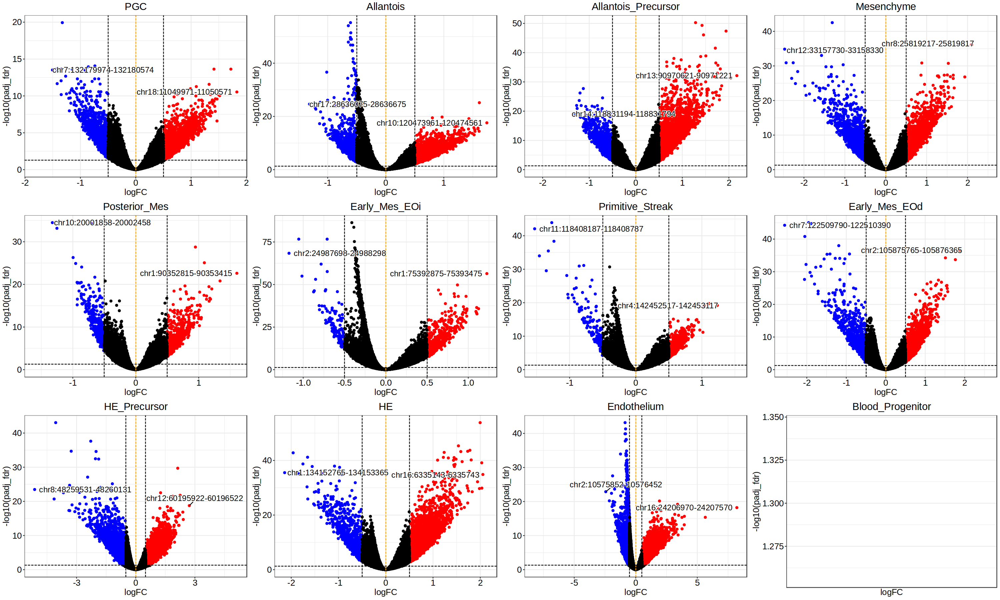

In [34]:
options(repr.plot.width=25, repr.plot.height=15)
ggarrange(plotlist=plots)

In [305]:
# write bed & perform HOMER
mclapply(unique(DARs$celltype), function(x){
    tmp = DARs[celltype==x][padj_fdr<0.05][logFC<=-0.4][order(logFC)] %>% 
        .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
            .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
            .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
        .[,c('chr', 'start', 'end')] %>% .[,start:=(start+end)/2] %>% .[,end:=start+1]

    fwrite(tmp, sprintf('%s/%s_down.bed', args$outdir, x) , col.names=F, sep='\t')
    
    tmp = DARs[celltype==x][padj_fdr<0.05][logFC>=0.4][order(logFC)] %>% 
        .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
            .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
            .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
        .[,c('chr', 'start', 'end')] %>% .[,start:=(start+end)/2] %>% .[,end:=start+1]

    fwrite(tmp, sprintf('%s/%s_up.bed', args$outdir, x) , col.names=F, sep='\t')      
})

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

In [289]:
# Accidentally deleted code to run homer??? put back
# Motif search using Homer
mclapply(files, function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s.bed mm10 %s/%s -size 75 -S 1 -len 8  -p 24', 
                       args$homer, x,
                         args$homer, x)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

In [36]:
nrow(DARs[celltype=='Early_Mes_EOd'][padj_fdr<0.05][logFC>=0.25][order(logFC)])

[1] 7583

In [37]:
test = DARs[celltype=='Early_Mes_EOd'][padj_fdr<0.05][logFC<=-0.25][order(logFC)] %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
        .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
        .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')] %>% .[,start:=(start+end)/2] %>% .[,end:=start+1]

head(test)
fwrite(test, file.path(args$outdir, 'test.bed') , col.names=F, sep='\t')

chr,start,end
<chr>,<dbl>,<dbl>
chr7,122510090,122510091
chr6,48491989,48491990
chr2,178841039,178841040
chr7,40815756,40815757
chr1,72806239,72806240
chr12,107265382,107265383


#### Motif enrichment

In [7]:
plot_enr_heatmap = function(motif_enrichment, ntop=25, TFs = NULL, title = 'Motifs in marker peaks', subtitle = NULL, color = 'darkblue') {

    if(!is.null(TFs)){
        keep_tfs = TFs
    }else{
        keep_tfs = motif_enrichment %>% .[,variable:=factor(celltype, levels= names(opts$celltype_v2.colors))] %>% .[order(c(celltype, -mlog10Padj))] %>% .[, head(.SD, ntop),  by=celltype] %>% .$feature   
    }
    
    enriched.dt = motif_enrichment[feature %in% keep_tfs] %>% .[order( -mlog10Padj)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,feature:=factor(feature, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(celltype, levels=names(opts$celltype_v2.colors))]
    
    p = ggplot(enriched.dt, aes(feature, celltype, color = Enrichment, size=mlog10Padj)) + 
        geom_point() +
        scale_color_gradient(low='white', high=color, name='-log10(P-adj)') + # , breaks = c(0,100), labels = c('Min', 'Max')
        scale_y_discrete(expand = c(0, 0.5)) + 
        scale_x_discrete(expand = c(0, 0.5)) + 
        geom_hline(yintercept=seq(.5, 20, 1), alpha=0.2) + 
        geom_hline(yintercept=c(6.5, 7.5), alpha=1) + 
        labs(title = title, caption = subtitle) + 
        theme(text=element_text(size=20), 
             axis.text = element_text(color='black'),
             axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=23), 
             axis.text.y= element_text(hjust=1, size = 20), # element_blank(), #
             axis.title = element_blank(),
             panel.border = element_rect(color='black', linewidth=1.5, fill = NA),
             panel.background = element_blank(),
             plot.title = element_text(size=25, face='plain', hjust=0.5),
             axis.line = element_blank(),
             legend.title = element_text(hjust=0, vjust = 1),
             legend.text = element_text(hjust=0.5, vjust = 0.5),
             legend.position = 'bottom')
    
p
    return(p)
}

In [8]:
# matches <- getMatches(ArchRProject, 'Motif_cisbp')
# rownames(matches) = rownames(atac.sce)

io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
# jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(jaspar_silico_chip, 'matches') = assay(jaspar_silico_chip, 'VirtualChipScores') > 0.20
assay(jaspar_silico_chip, 'motifScores') = NULL
assay(jaspar_silico_chip, 'motifMatches') = NULL
assay(jaspar_silico_chip, 'motifCounts') = NULL
assay(jaspar_silico_chip, 'VirtualChipScores') = NULL
matches = jaspar_silico_chip

In [133]:
celltypes = unique(DARs$celltype)
celltypes = c('Early_Mes_EOd', 'Primitive_Streak', 'Early_Mes_EOi')
ntop = 20
options(repr.plot.width=8, repr.plot.height=4)

up = lapply(celltypes, function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, DARs[celltype == x & logFC > 0.5 & padj_fdr < 5e-3, peak], seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)] %>% 
            .[,celltype := x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))]
p1 = plot_enr_heatmap(up, ntop = ntop, title = 'Up', color = 'darkred')

down = lapply(celltypes, function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, DARs[celltype == x & logFC <= -0.5 & padj_fdr < 5e-3, peak], seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)] %>% 
            .[,celltype := x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))]
p2 = plot_enr_heatmap(down, ntop = ntop, title = 'Down')

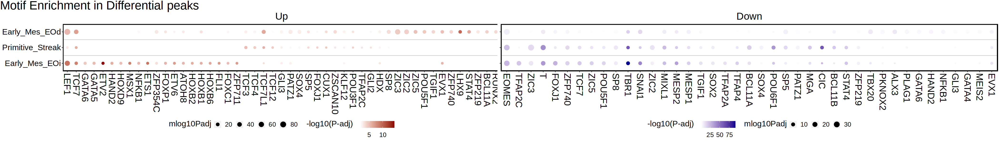

In [134]:
options(repr.plot.width=35, repr.plot.height=5)

ggarrange(p1, NULL, p2 + theme(axis.text.y = element_blank()), align = 'h', widths = c(1, -0.01, 1), nrow = 1) + 
    ggtitle('Motif Enrichment in Differential peaks') + 
    theme(plot.title = element_text(size = 30, hjust = 0),
            plot.title.position = "plot",
            plot.margin = unit(c(0,0, 0, 0), 'lines'))

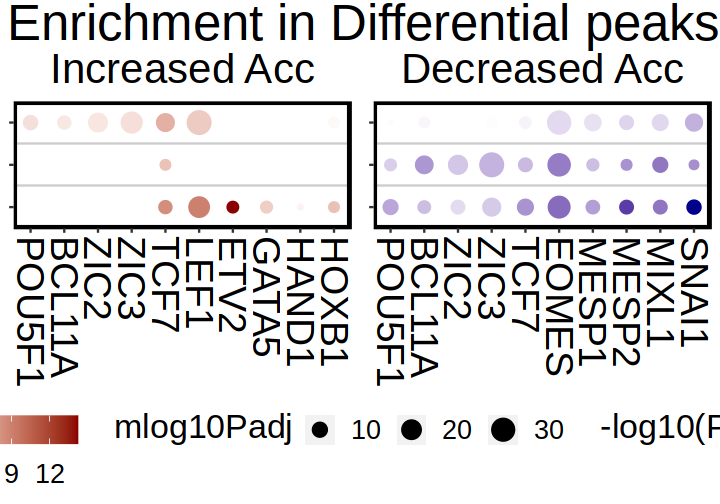

In [314]:
celltypes = unique(DARs$celltype)
celltypes = c('Early_Mes_EOd', 'Primitive_Streak', 'Early_Mes_EOi')
ntop = 20
options(repr.plot.width=8, repr.plot.height=4)

up = lapply(celltypes, function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, DARs[celltype == x & logFC > 0.5 & padj_fdr < 5e-3, peak], seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)] %>% 
            .[,celltype := x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))]
p1 = plot_enr_heatmap(up, TFs = c('POU5F1', 'BCL11A', 'ZIC2', 'ZIC3', 'TCF7', 'LEF1', 'ETV2', 'GATA5', 'HAND1', 'HOXB1'), title = 'Increased Acc', color = 'darkred')
# Plot Hand2 instead of Hand1
down = lapply(celltypes, function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, DARs[celltype == x & logFC <= -0.5 & padj_fdr < 5e-3, peak], seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)] %>% 
            .[,celltype := x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))]
p2 = plot_enr_heatmap(down, TFs = c('POU5F1', 'BCL11A', 'ZIC2', 'ZIC3', 'TCF7', 'EOMES', 'MESP1', 'MESP2', 'MIXL1',  'SNAI1'), title = 'Decreased Acc')

options(repr.plot.width=6, repr.plot.height=4.2)

ggarrange(p1 + theme(axis.text.y = element_blank()), NULL, p2 + theme(axis.text.y = element_blank()), align = 'h', widths = c(1, -0.0, 1), nrow = 1) + 
    ggtitle('Enrichment in Differential peaks') + 
    theme(plot.title = element_text(size = 30, hjust = 1),
            #plot.title.position = "plot",
            plot.margin = unit(c(0,0, 0, 0), 'lines'))

In [12]:
celltypes = unique(DARs$celltype)
# celltypes = c('Early_Mes_EOd', 'Primitive_Streak', 'Early_Mes_EOi')
ntop = 10
options(repr.plot.width=8, repr.plot.height=4)

up = lapply(celltypes, function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, DARs[celltype == x & logFC > 0.5 & padj_fdr < 5e-3, peak], seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)] %>% 
            .[,celltype := x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))]
p1 = plot_enr_heatmap(up, ntop = ntop, title = 'Up', color = 'darkred')

down = lapply(celltypes, function(x){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, DARs[celltype == x & logFC <= -0.5 & padj_fdr < 5e-3, peak], seq_len(nrow(matches)))) %>%
            .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
            .[mlog10Padj > -log10(0.05)] %>% 
            .[,celltype := x]
    return(tmp)
}) %>% rbindlist() %>% 
    .[, celltype := factor(celltype, levels = names(opts$celltype_v2.colors))]
p2 = plot_enr_heatmap(down, ntop = ntop, title = 'Down')

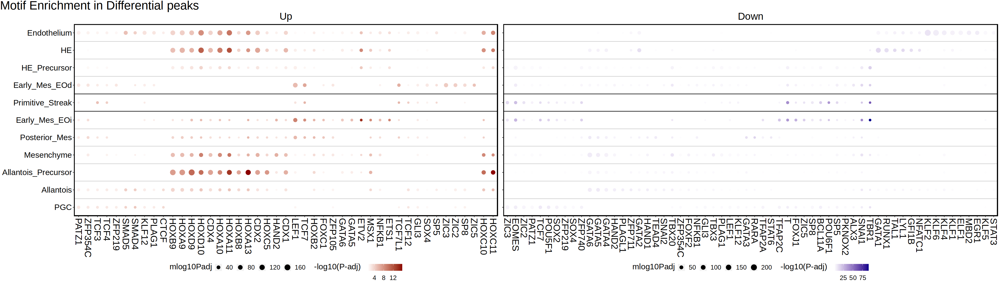

In [14]:
options(repr.plot.width=35, repr.plot.height=10)

ggarrange(p1, p2 + theme(axis.text.y = element_blank()), align = 'h', widths = c(1, 1), nrow = 1) + 
    ggtitle('Motif Enrichment in Differential peaks') + 
    theme(plot.title = element_text(size = 30, hjust = 0),
            plot.title.position = "plot",
            plot.margin = unit(c(0,0, 0, 0), 'lines'))

# Combinatorial motif enrichment

In [7]:
head(DARs)

peak,logFC,padj_fdr,mean_groupA,mean_groupB,cdr_groupA,cdr_groupB,celltype
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
chr9:46913091-46913691,-1.326,1.16e-20,4.14,2.94,0.23,0.18,PGC
chr4:125590388-125590988,-0.738,8.55e-15,4.81,4.12,0.40,0.39,PGC
chr12:113239955-113240555,-0.856,1.14e-14,4.51,3.71,0.32,0.27,PGC
chr10:81560139-81560739,1.718,2.33e-14,1.73,3.14,0.06,0.21,PGC
chr19:36679363-36679963,-1.340,2.33e-14,3.62,2.46,0.19,0.13,PGC
chr2:102544236-102544836,-1.430,2.33e-14,3.47,2.25,0.17,0.08,PGC


In [8]:
# matches <- getMatches(ArchRProject, 'Motif_cisbp')
# rownames(matches) = rownames(atac.sce)

io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp.rds'))
# jaspar_silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_jaspar2020.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.2
assay(silico_chip, 'motifScores') = NULL
assay(silico_chip, 'motifMatches') = NULL
assay(silico_chip, 'motifCounts') = NULL
assay(silico_chip, 'VirtualChipScores') = NULL
matches = silico_chip

In [9]:
motifs = getMatches(ArchRProject, 'Motif_cisbp')
colnames(motifs) = str_to_upper(str_split(colnames(motifs), '_') %>% map_chr(1))
rownames(motifs) = rownames(silico_chip)

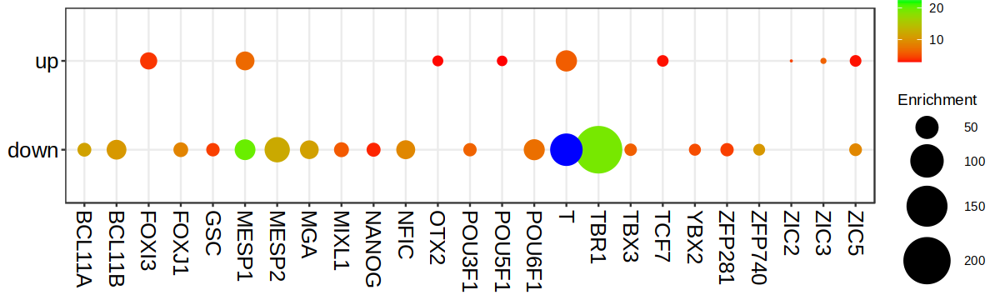

In [25]:
TF = 'EOMES'
celltypes = c('Primitive_Streak', 'Early_Mes_EOi', 'Early_Mes_EOd') # , 
#celltypes = names(opts$celltype_v2.colors)

chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('peak', 'gene')) %>%
    .[gene == TRUE] 

up = DARs %>% copy() %>%
    .[logFC >= 0.5 & padj_fdr < 5e-2] %>%
    .[celltype %in% celltypes] %>% 
    .[peak %in% chip_tmp$peak] %>% unique(by='peak')

down =  DARs %>% copy() %>%
    .[logFC <= -0.5 & padj_fdr < 5e-2] %>%
    .[celltype %in% celltypes] %>% 
    .[peak %in% chip_tmp$peak] %>% unique(by='peak')

up_motifs = as.data.table(ArchR:::.computeEnrichment(matches, up$peak, seq_len(nrow(matches)))) %>% 
    .[mlog10Padj > -log10(0.05)] %>% .[order(-Enrichment)] %>% .[CompareFrequency > 3] %>% head(20) %>% .[, direction := 'up']

down_motifs = as.data.table(ArchR:::.computeEnrichment(matches, down$peak, seq_len(nrow(matches)))) %>% 
    .[mlog10Padj > -log10(0.05)]%>% .[order(-Enrichment)] %>% .[CompareFrequency > 3] %>% head(20) %>% .[, direction := 'down']


options(repr.plot.width=10, repr.plot.height=3)
ggplot(rbind(up_motifs, down_motifs)[feature != TF], aes(feature, direction, color = mlog10Padj, size = Enrichment)) + 
    geom_point() + 
    scale_size(range = c(0, 15)) + 
    scale_color_gradientn(colors = rainbow(3)) + 
    theme_bw() + 
    theme(axis.text.x = element_text(angle = -90, hjust = 0, vjust = 0.5),
          axis.text = element_text(size = 15, color = 'black'),
          axis.title = element_blank())

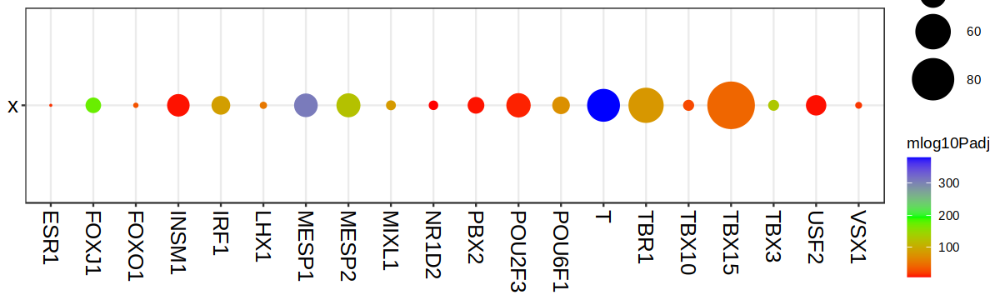

In [29]:
TF = 'EOMES'
celltypes = c('Primitive_Streak', 'Early_Mes_EOi', 'Early_Mes_EOd') # , 
#celltypes = names(opts$celltype_v2.colors)

chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('peak', 'gene')) %>%
    .[gene == TRUE] 

cobinding = as.data.table(ArchR:::.computeEnrichment(matches, chip_tmp$peak, seq_len(nrow(matches)))) %>% 
    .[mlog10Padj > -log10(0.05)] %>% .[order(-Enrichment)] 

options(repr.plot.width=10, repr.plot.height=3)
ggplot(cobinding[feature != TF & CompareFrequency > 5] %>% head(20), aes(feature, 'x', color = mlog10Padj, size = Enrichment)) + 
    geom_point() + 
    scale_size(range = c(0, 15)) + 
    scale_color_gradientn(colors = rainbow(3)) + 
    theme_bw() + 
    theme(axis.text.x = element_text(angle = -90, hjust = 0, vjust = 0.5),
          axis.text = element_text(size = 15, color = 'black'),
          axis.title = element_blank())

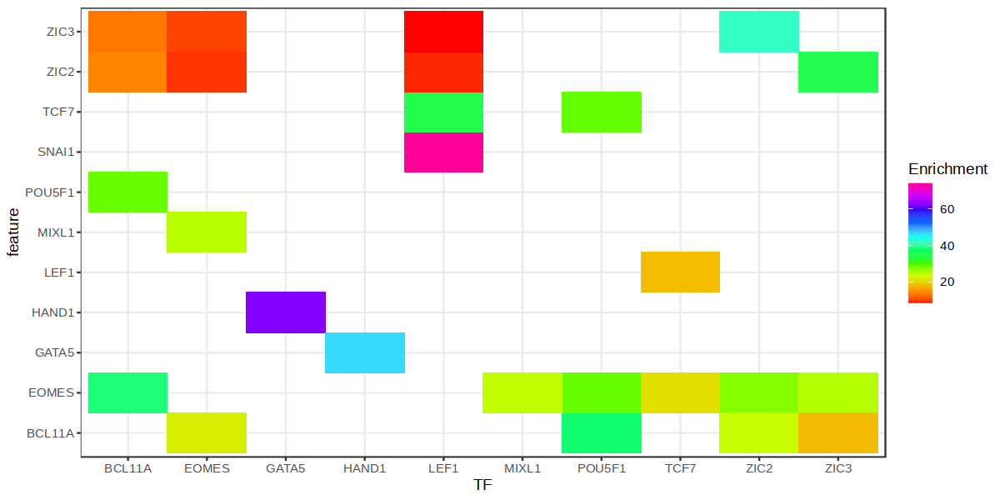

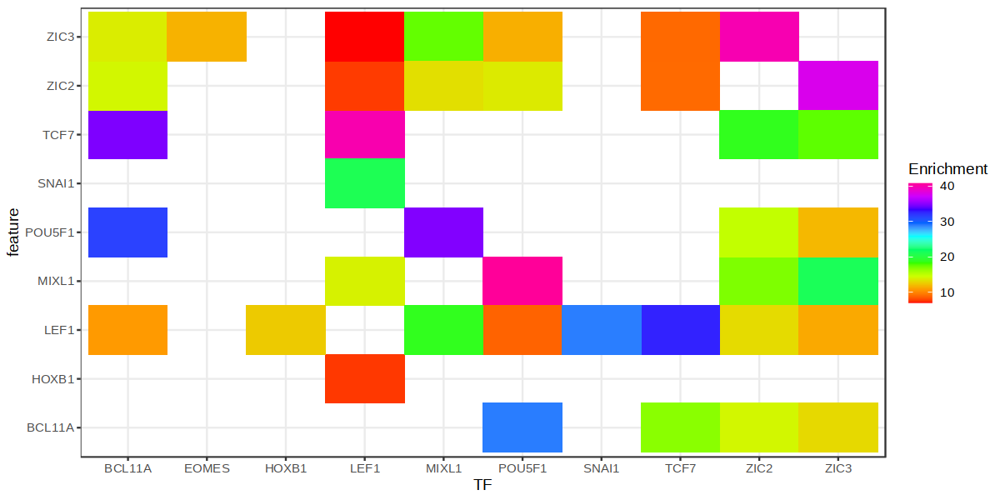

In [11]:
TF = 'ZIC3'
TFs = c('POU5F1', 'BCL11A', 'ZIC2', 'ZIC3', 'TCF7', 'LEF1', 'ETV2', 'GATA5', 'HAND1', 'HOXB1', 'EOMES',  'MIXL1',  'SNAI1')
test = lapply(TFs, function(TF){
    celltypes = c('Primitive_Streak', 'Early_Mes_EOi', 'Early_Mes_EOd') # , 
    #celltypes = names(opts$celltype_v2.colors)

    chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
        setnames(c('peak', 'gene')) %>%
        .[gene == TRUE] 

    peaks = DARs %>% copy() %>%
        .[logFC <= -0.5 & padj_fdr < 5e-2] %>%
        .[celltype %in% celltypes] %>% 
        .[peak %in% chip_tmp$peak] %>% unique(by='peak')

    motifs = as.data.table(ArchR:::.computeEnrichment(matches, peaks$peak, seq_len(nrow(matches)))) %>% 
        .[mlog10Padj > 5] %>% .[order(-Enrichment)] %>% 
        .[, TF := TF]
    return(motifs)
}) %>% rbindlist()
options(repr.plot.width=10, repr.plot.height=5)
ggplot(test[feature %in% TFs][feature != TF], 
       aes(TF, feature, fill = Enrichment)) + 
    geom_tile() + 
    scale_fill_gradientn(colors = rainbow(10)) + 
    theme_bw()
test = lapply(TFs, function(TF){
    celltypes = c('Primitive_Streak', 'Early_Mes_EOi', 'Early_Mes_EOd') # , 
    #celltypes = names(opts$celltype_v2.colors)

    chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
        setnames(c('peak', 'gene')) %>%
        .[gene == TRUE] 

    peaks = DARs %>% copy() %>%
        .[logFC >= 0.5 & padj_fdr < 5e-2] %>%
        .[celltype %in% celltypes] %>% 
        .[peak %in% chip_tmp$peak] %>% unique(by='peak')

    motifs = as.data.table(ArchR:::.computeEnrichment(matches, peaks$peak, seq_len(nrow(matches)))) %>% 
        .[mlog10Padj > 5] %>% .[order(-Enrichment)] %>% 
        .[, TF := TF]
    return(motifs)
}) %>% rbindlist()
options(repr.plot.width=10, repr.plot.height=5)
ggplot(test[feature %in% TFs][feature != TF], 
       aes(TF, feature, fill = Enrichment)) + 
    geom_tile() + 
    scale_fill_gradientn(colors = rainbow(10)) + 
    theme_bw()


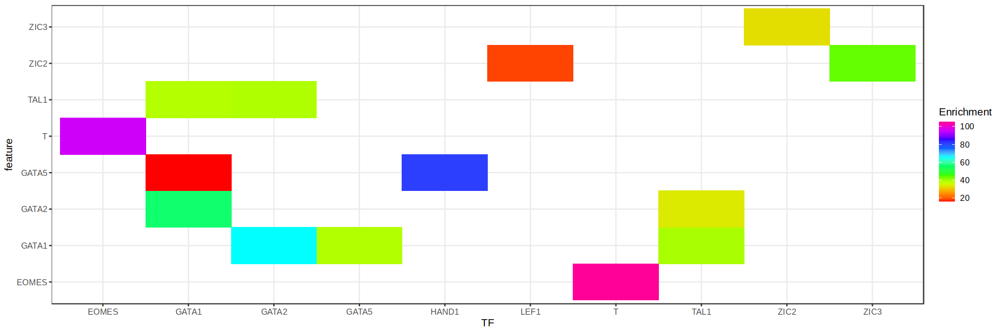

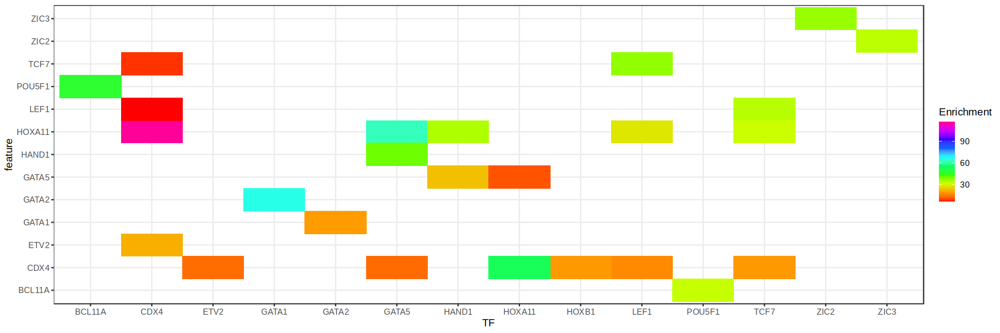

In [344]:
TF = 'ZIC3'
TFs = c('POU5F1', 'BCL11A', 'ZIC2', 'ZIC3', 'TCF7', 'LEF1', 'ETV2', 'GATA5', 'HAND1', 'HOXB1', 'EOMES', 'MIXL1',  'SNAI1', 'HOXA11', 'CDX4', 'TAL1', 'GATA2', 'GATA1', 'T')
    celltypes = c('Primitive_Streak', 'Early_Mes_EOi', 'Early_Mes_EOd') # , 
    #celltypes = names(opts$celltype_v2.colors)
    celltypes = 'Primitive_Streak'
options(repr.plot.width=15, repr.plot.height=5)

test = lapply(TFs, function(TF){
    chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
        setnames(c('peak', 'gene')) %>%
        .[gene == TRUE] 

    peaks = DARs %>% copy() %>%
        .[logFC <= -0.5 & padj_fdr < 5e-2] %>%
        .[celltype %in% celltypes] %>% 
        .[peak %in% chip_tmp$peak] %>% unique(by='peak')

    motifs = as.data.table(ArchR:::.computeEnrichment(matches, peaks$peak, seq_len(nrow(matches)))) %>% 
        .[mlog10Padj > 5] %>% .[order(-Enrichment)] %>% 
        .[, TF := TF] %>% head(100)
    return(motifs)
}) %>% rbindlist()
ggplot(test[feature %in% TFs][feature != TF], 
       aes(TF, feature, fill = Enrichment)) + 
    geom_tile() + 
    scale_fill_gradientn(colors = rainbow(10)) + 
    theme_bw()
test = lapply(TFs, function(TF){
    chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
        setnames(c('peak', 'gene')) %>%
        .[gene == TRUE] 

    peaks = DARs %>% copy() %>%
        .[logFC >= 0.5 & padj_fdr < 5e-2] %>%
        .[celltype %in% celltypes] %>% 
        .[peak %in% chip_tmp$peak] %>% unique(by='peak')

    motifs = as.data.table(ArchR:::.computeEnrichment(matches, peaks$peak, seq_len(nrow(matches)))) %>% 
        .[mlog10Padj > 5] %>% .[order(-Enrichment)] %>% 
        .[, TF := TF] %>% head(100)
    return(motifs)
}) %>% rbindlist()
ggplot(test[feature %in% TFs][feature != TF], 
       aes(TF, feature, fill = Enrichment)) + 
    geom_tile() + 
    scale_fill_gradientn(colors = rainbow(10)) + 
    theme_bw()


In [17]:
TF = 'EOMES'

args$homer = sprintf('%s/TF_cobinding/homer/', args$outdir)
dir.create(args$homer, recursive=TRUE, showWarnings =FALSE)

chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('peak', 'gene')) %>%
    .[gene == TRUE] 

up = DARs %>% copy() %>%
    .[logFC >= 0.5 & padj_fdr < 5e-2] %>%
    .[celltype %in% celltypes] %>% 
    .[peak %in% chip_tmp$peak] %>% unique(by='peak') %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
    .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
    .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')]
fwrite(down, sprintf('%s/up.bed', args$homer) , col.names=F, sep='\t')

down =  DARs %>% copy() %>%
    .[logFC <= -0.5 & padj_fdr < 5e-2] %>%
    .[celltype %in% celltypes] %>% 
    .[peak %in% chip_tmp$peak] %>% unique(by='peak') %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
    .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
    .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')]
fwrite(down, sprintf('%s/down.bed', args$homer) , col.names=F, sep='\t')

files = gsub('.bed', '', list.files(args$homer, pattern = '.bed'))

# Motif search using Homer
mclapply(files, function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s.bed mm10 %s/%s -size 75 -S 1 -len 8  -p 24', 
                       args$homer, x,
                         args$homer, x)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

In [18]:
args$homer = sprintf('%s/TF_cobinding/homer/all_motifs/', args$outdir)
dir.create(args$homer, recursive=TRUE, showWarnings =FALSE)

chip_tmp = as.data.table(as.matrix(assay(motifs[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('peak', 'gene')) %>%
    .[gene == TRUE] 

up = DARs %>% copy() %>%
    .[logFC >= 0.5 & padj_fdr < 5e-2] %>%
    .[celltype %in% celltypes] %>% 
    .[peak %in% chip_tmp$peak] %>% unique(by='peak') %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
    .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
    .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')]
fwrite(up, sprintf('%s/up.bed', args$homer) , col.names=F, sep='\t')

down =  DARs %>% copy() %>%
    .[logFC <= -0.5 & padj_fdr < 5e-2] %>%
    .[celltype %in% celltypes] %>% 
    .[peak %in% chip_tmp$peak] %>% unique(by='peak') %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
    .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
    .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')]
fwrite(down, sprintf('%s/down.bed', args$homer) , col.names=F, sep='\t')

files = gsub('.bed', '', list.files(args$homer, pattern = '.bed'))

# Motif search using Homer
mclapply(files, function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s.bed mm10 %s/%s -size 75 -S 1 -len 8  -p 24', 
                       args$homer, x,
                         args$homer, x)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

In [30]:
# All Eomes silicoChIP peaks
args$homer = sprintf('%s/TF_cobinding/homer/eomes/', args$outdir)
dir.create(args$homer, recursive=TRUE, showWarnings =FALSE)

chip_tmp = as.data.table(as.matrix(assay(matches[,TF], 'matches')), keep.rownames = T) %>% 
    setnames(c('peak', 'gene')) %>%
    .[gene == TRUE] %>% 
    .[, chr:=str_split(peak, ':') %>% map_chr(1)] %>%
    .[, start:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(1))] %>%
    .[, end:=as.numeric(str_split(str_split(peak, ':') %>% map_chr(2), '-') %>% map_chr(2))] %>%
    .[,c('chr', 'start', 'end')]
fwrite(down, sprintf('%s/eomes.bed', args$homer) , col.names=F, sep='\t')

cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s.bed mm10 %s/%s -size 75 -S 5 -len 8,10,12 -p 24', 
                   args$homer, 'eomes',
                     args$homer, 'eomes')
system(cmd)

# Plot ChromVAR

In [7]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"   "DeviationMatrix_JASPAR" 
 [3] "GeneScoreMatrix_TSS"     "GeneScoreMatrix_distal" 
 [5] "MarkerPeaksMatrix"       "PeakMatrix"             
 [7] "PeakMatrix_atlas"        "TileMatrix"             
 [9] "silicoChIPMatrix"        "silicoChIP_CISBPMatrix" 
[11] "silicoChIP_JASPARMatrix"

In [104]:
chromVAR.sce = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "DeviationMatrix_JASPAR")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-33ca365c78507-Date-2023-06-07_Time-00-22-18.log
If there is an issue, please report to github with logFile!

2023-06-07 00:22:33 : Organizing colData, 0.243 mins elapsed.

2023-06-07 00:22:34 : Organizing rowData, 0.259 mins elapsed.

2023-06-07 00:22:34 : Organizing rowRanges, 0.259 mins elapsed.

2023-06-07 00:22:34 : Organizing Assays (1 of 2), 0.259 mins elapsed.

2023-06-07 00:22:37 : Organizing Assays (2 of 2), 0.309 mins elapsed.

2023-06-07 00:22:38 : Constructing SummarizedExperiment, 0.337 mins elapsed.

2023-06-07 00:22:39 : Finished Matrix Creation, 0.355 mins elapsed.



In [105]:
chromVAR.sce = chromVAR.sce[, match(meta$cell, colnames(chromVAR.sce))]

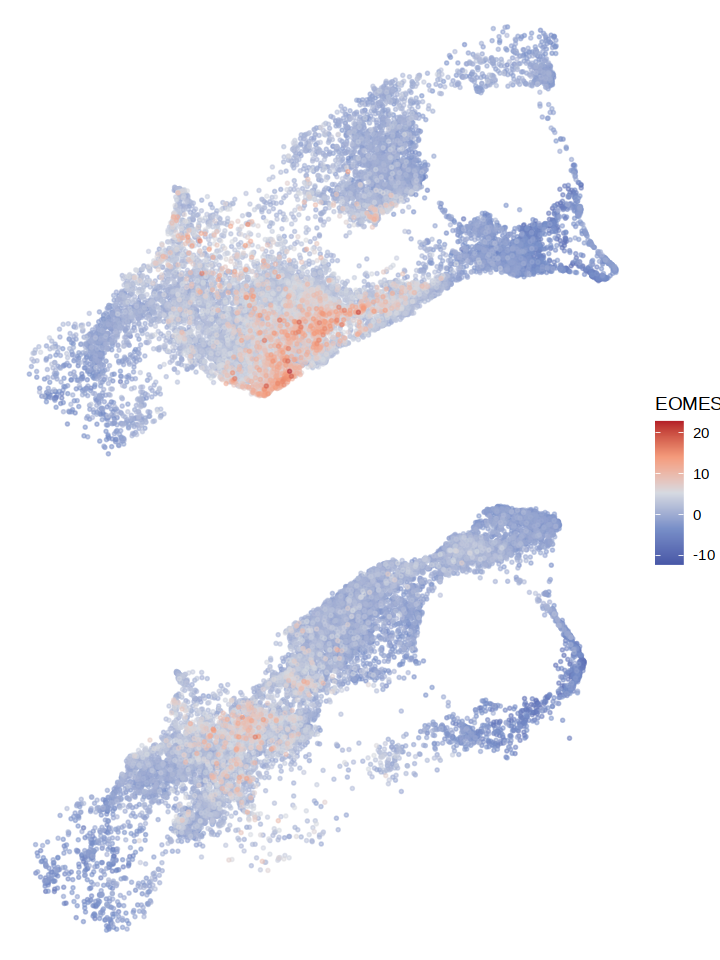

In [54]:
gene = 'EOMES'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=6, repr.plot.height=8)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    #scale_color_gradient(low='grey80', high='darkblue', name=gene) + 
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=1) + 
    theme_void() + 
    theme(strip.text=element_blank())

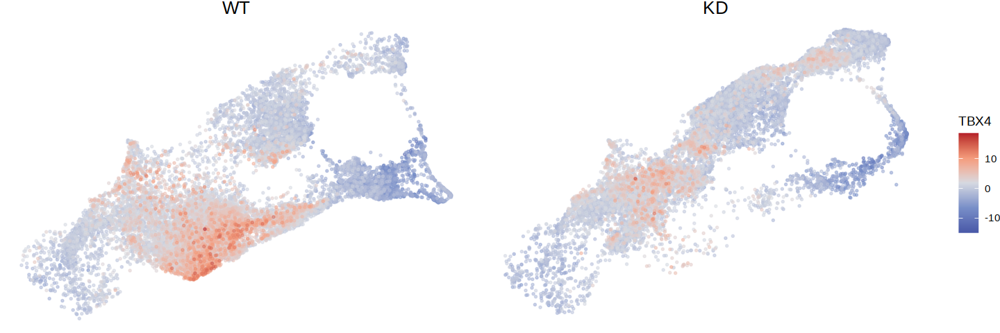

In [55]:
gene = 'TBX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

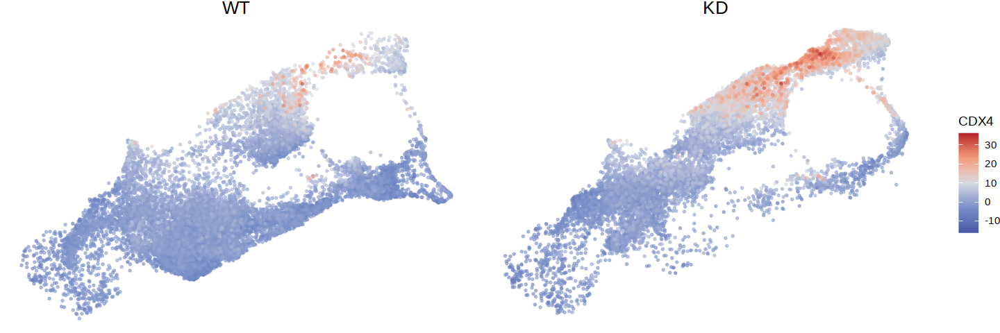

In [56]:
gene = 'CDX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

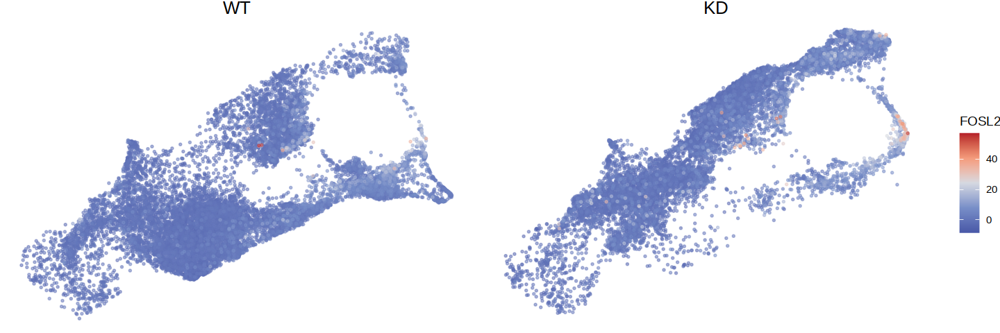

In [116]:
gene = 'FOSL2'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),][1], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

#### silicoChIP

In [57]:
chromVAR.sce = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "silicoChIP_JASPARMatrix")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-33ca325a9811-Date-2023-06-06_Time-22-27-42.log
If there is an issue, please report to github with logFile!

2023-06-06 22:27:46 : Organizing colData, 0.062 mins elapsed.

2023-06-06 22:27:47 : Organizing rowData, 0.079 mins elapsed.

2023-06-06 22:27:47 : Organizing rowRanges, 0.079 mins elapsed.

2023-06-06 22:27:47 : Organizing Assays (1 of 2), 0.079 mins elapsed.

2023-06-06 22:27:48 : Organizing Assays (2 of 2), 0.097 mins elapsed.

2023-06-06 22:27:50 : Constructing SummarizedExperiment, 0.134 mins elapsed.

2023-06-06 22:27:51 : Finished Matrix Creation, 0.152 mins elapsed.



In [48]:
chromVAR.sce = chromVAR.sce[, match(meta$cell, colnames(chromVAR.sce))]

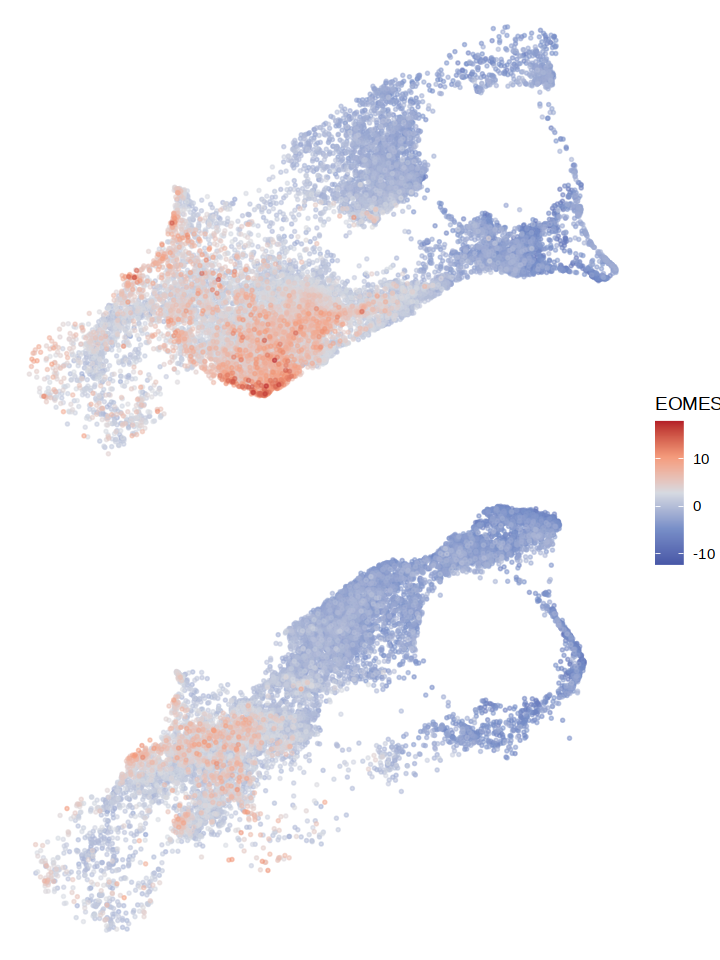

In [49]:
gene = 'EOMES'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=6, repr.plot.height=8)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    #scale_color_gradient(low='grey80', high='darkblue', name=gene) + 
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=1) + 
    theme_void() + 
    theme(strip.text=element_blank())

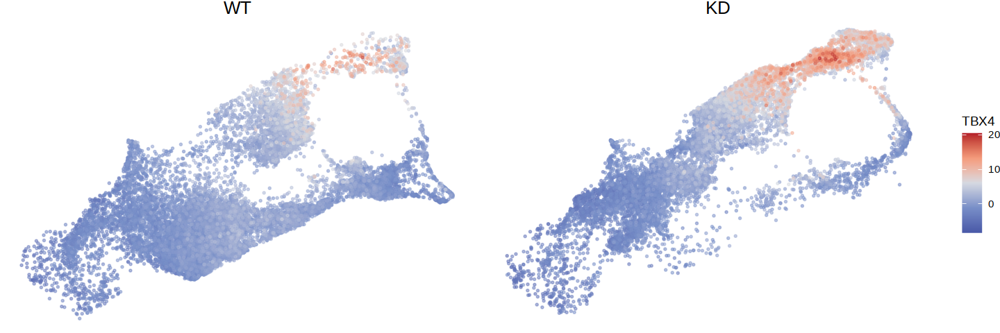

In [50]:
gene = 'TBX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

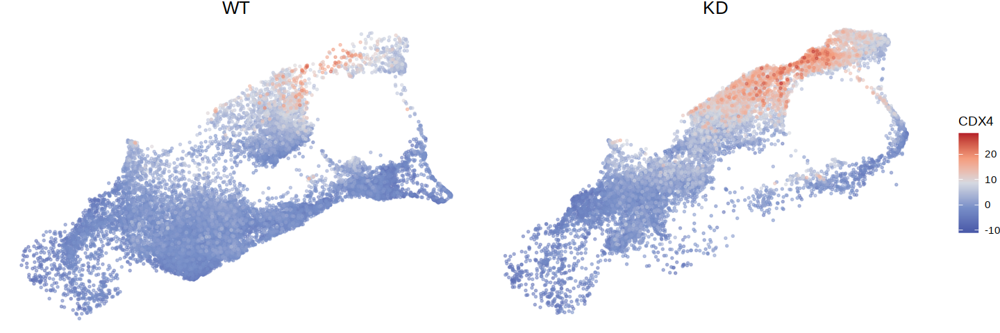

In [51]:
gene = 'CDX4'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))

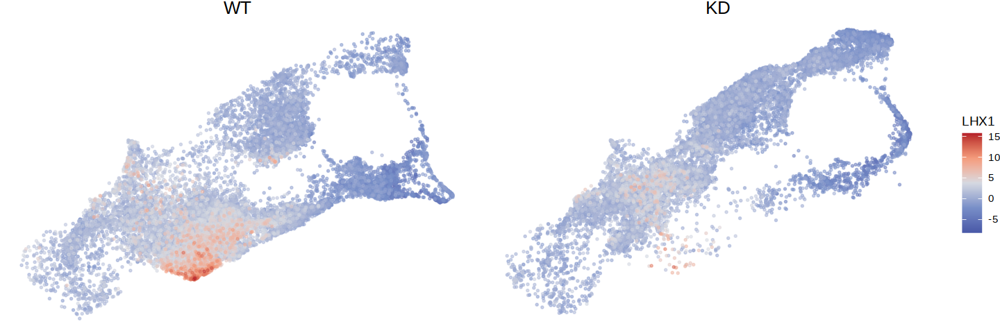

In [103]:
gene = 'LHX1'

meta = meta[match(colnames(chromVAR.sce), cell)]
meta$chromVAR = as.vector(assay(chromVAR.sce[grep(gene, rownames(chromVAR.sce)),], 'z'))
meta = meta[,genotype:=factor(gsub('KO', 'KD', genotype), levels=c('WT', 'KD'))] %>%
    .[order(chromVAR)]
options(repr.plot.width=12, repr.plot.height=4)
ggplot(meta, aes(UMAP1, UMAP2, col=chromVAR)) + 
    geom_point(size=0.5, alpha=0.5) +
    scale_color_gradientn(colours=ArchR::ArchRPalettes$coolwarm, name=gene)+
    facet_wrap(~genotype, ncol=2) + 
    theme_void() + 
    theme(strip.text=element_text(size=15))